<a href="https://colab.research.google.com/github/AdaChen1130/Ecommerce-affecting-brickandmortar-retail/blob/main/e_commerce_update.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd

import matplotlib.pyplot as plt
import plotly.express as px

import seaborn as sns

import statsmodels.api as sm

In [3]:
sns.set_theme()

In [4]:
df = pd.read_excel('NBS_merged.xlsx', header=0)
df = df.loc[:, (df != 0).any(axis=0)]

df = df.set_index("Indicators")
df = df.transpose().reset_index()
df["time"] = pd.to_datetime(df["index"])
df = df.drop("index", axis=1).set_index("time")
df.columns = pd.MultiIndex.from_tuples([col.split(",", 1) for col in df.columns])
df = df.sort_index(axis=1)
df = df.dropna(axis=1, how="all").dropna(axis=0, how="all")

In [5]:
df.head()

Online Retail Sales                              \
            Accumulated Growth Rate(%)  Accumulated Growth Rate(%)   
time                                                                 
2023-09-01                        11.6                        11.6   
2023-08-01                        12.1                        12.1   
2023-07-01                        12.5                        12.5   
2023-06-01                        13.1                        13.1   
2023-05-01                        13.8                        13.8   

           Online Retail Sales in Clothing                              \
                Accumulated Growth Rate(%)  Accumulated Growth Rate(%)   
time                                                                     
2023-09-01                             9.6                         9.6   
2023-08-01                            10.9                        10.9   
2023-07-01                            12.0                        12.0   
2023-06-01                            13.3                        13.3   
2023-05-01                            14.6                        14.6   

           Online Retail Sales in Food                              \
            Accumulated Growth Rate(%)  Accumulated Growth Rate(%)   
time                                                                 
2023-09-01                        10.4                        10.4   
2023-08-01                         8.4                         8.4   
2023-07-01                         8.7                         8.7   
2023-06-01                         8.9                         8.9   
2023-05-01                         8.4                         8.4   

           Online Retail Sales in Goods                              \
             Accumulated Growth Rate(%)  Accumulated Growth Rate(%)   
time                                                                  
2023-09-01                          8.9                         8.9   
2023-08-01                          9.5                         9.5   
2023-07-01                         10.0                        10.0   
2023-06-01                         10.8                        10.8   
2023-05-01                         11.8                        11.8   

                                                                          ...  \
            Accumulated(100 million yuan)  Accumulated(100 million yuan)  ...   
time                                                                      ...   
2023-09-01                        90435.0                        90435.0  ...   
2023-08-01                        79820.6                        79820.6  ...   
2023-07-01                        69856.1                        69856.1  ...   
2023-06-01                        60622.7                        60622.7  ...   
2023-05-01                        48054.7                        48054.7  ...   

           Total Retail Sales of Rural Consumer Goods  \
                           Accumulated Growth Rate(%)   
time                                                    
2023-09-01                                        7.4   
2023-08-01                                        7.6   
2023-07-01                                        7.7   
2023-06-01                                        8.4   
2023-05-01                                        9.4   

                                                                          \
            Accumulated(100 million yuan)  Accumulated(100 million yuan)   
time                                                                       
2023-09-01                        45696.8                        45696.8   
2023-08-01                        39855.5                        39855.5   
2023-07-01                        34896.5                        34896.5   
2023-06-01                        30055.9                        30055.9   
2023-05-01                        24668.0                        24668.0   

                    

In [10]:
df.to_excel('filename.xlsx')

In [9]:
print(*df.columns, sep="\n")

('Online Retail Sales', ' Accumulated Growth Rate(%)')
('Online Retail Sales', ' Accumulated Growth Rate(%)')
('Online Retail Sales in Clothing', ' Accumulated Growth Rate(%)')
('Online Retail Sales in Clothing', ' Accumulated Growth Rate(%)')
('Online Retail Sales in Food', ' Accumulated Growth Rate(%)')
('Online Retail Sales in Food', ' Accumulated Growth Rate(%)')
('Online Retail Sales in Goods', ' Accumulated Growth Rate(%)')
('Online Retail Sales in Goods', ' Accumulated Growth Rate(%)')
('Online Retail Sales in Goods', ' Accumulated(100 million yuan)')
('Online Retail Sales in Goods', ' Accumulated(100 million yuan)')
('Online Retail Sales in Necessities', ' Accumulated Growth Rate(%)')
('Online Retail Sales in Necessities', ' Accumulated Growth Rate(%)')
('Retail Sales of Consumer Goods of Enterprises above Designated Size', 'Accumulated Growth Rate(%)')
('Retail Sales of Consumer Goods of Enterprises above Designated Size', 'Accumulated Growth Rate(%)')
('Retail Sales of Consum

<ipython-input-13-e0360dcdf13a>:30: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_data = data_cleaned.groupby(['Year', 'Month']).mean()


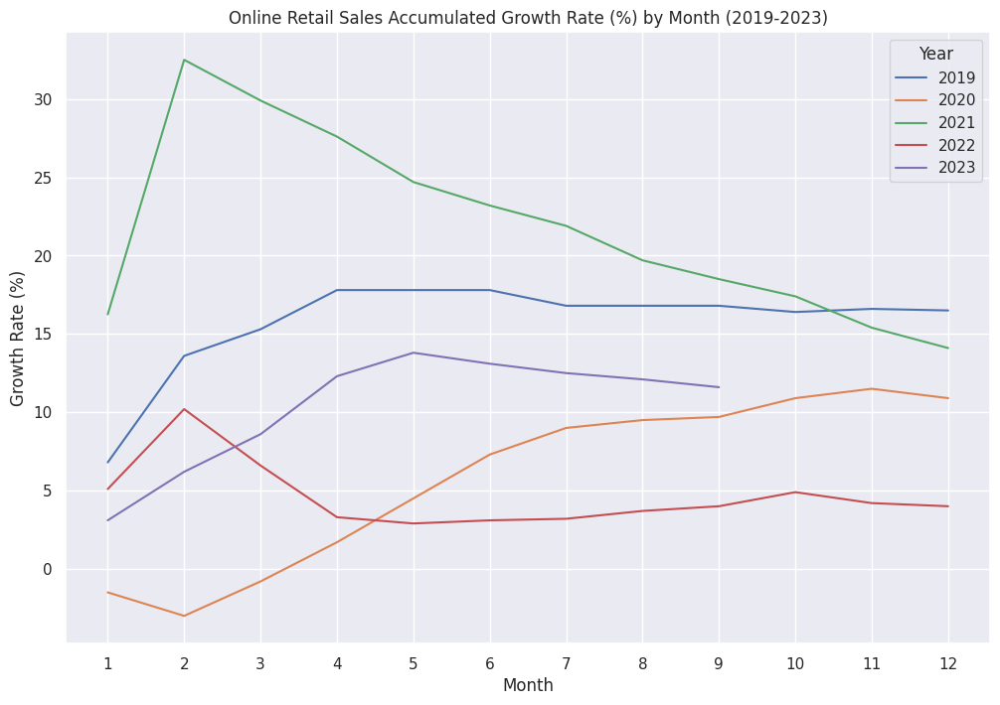

In [13]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from datetime import datetime


data = pd.read_excel('cleaned.xlsx')


data_cleaned = data[['Unnamed: 0', 'Online Retail Sales']].copy()


data_cleaned.columns = ['Time', 'GrowthRate']


data_cleaned = data_cleaned.drop([0, 1])


data_cleaned['Time'] = pd.to_datetime(data_cleaned['Time'])
data_cleaned['GrowthRate'] = pd.to_numeric(data_cleaned['GrowthRate'], errors='coerce')


data_cleaned = data_cleaned[data_cleaned['Time'].dt.year.between(2019, 2023)]


data_cleaned['Year'] = data_cleaned['Time'].dt.year
data_cleaned['Month'] = data_cleaned['Time'].dt.month


grouped_data = data_cleaned.groupby(['Year', 'Month']).mean()


plt.figure(figsize=(12, 8))


years = grouped_data.index.get_level_values(0).unique()


for year in years:
    plt.plot(grouped_data.loc[year].index, grouped_data.loc[year]['GrowthRate'], label=str(year))

plt.title('Online Retail Sales Accumulated Growth Rate (%) by Month (2019-2023)')
plt.xlabel('Month')
plt.ylabel('Growth Rate (%)')
plt.legend(title='Year')
plt.grid(True)
plt.xticks(np.arange(1, 13, 1))  # Setting x-ticks to be each month

plt.show()


<ipython-input-14-455d6c7da966>:30: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_data = data_cleaned.groupby(['Year', 'Month']).mean()


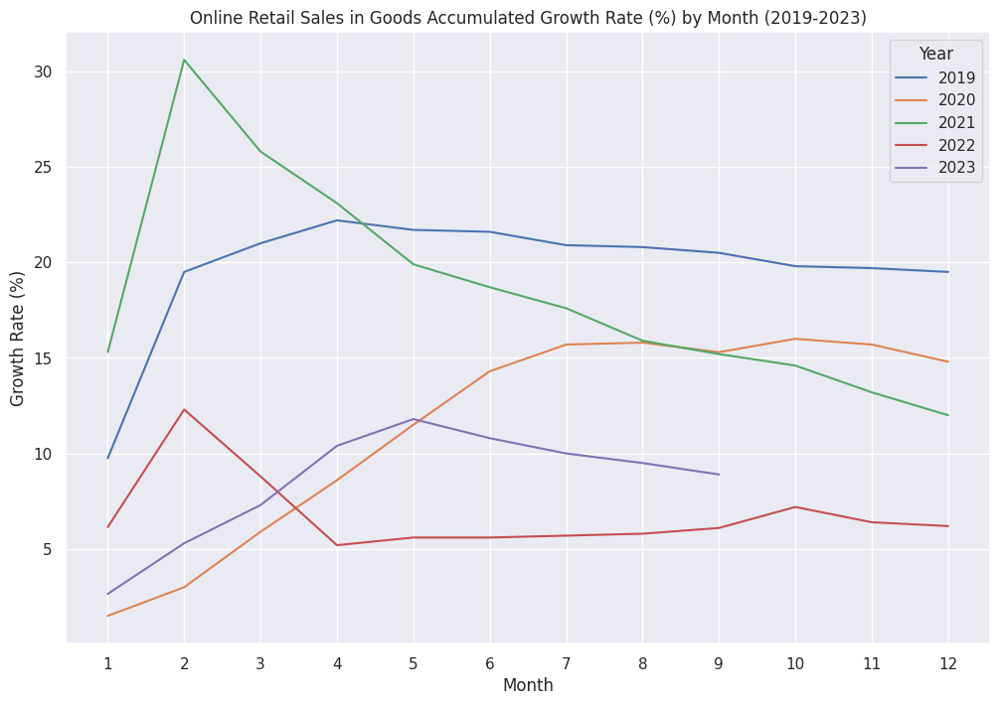

In [14]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Load the data from the uploaded Excel file
file_path = 'cleaned.xlsx'  # Replace with your file path
data = pd.read_excel(file_path)

# Selecting the relevant columns (time and Online Retail Sales in Goods Growth Rate)
data_cleaned = data[['Unnamed: 0', 'Online Retail Sales in Goods']].copy()

# Rename the columns for easier access
data_cleaned.columns = ['Time', 'GrowthRate']

# Remove the first two rows which are not actual data
data_cleaned = data_cleaned.drop([0, 1])

# Convert 'Time' to datetime and 'GrowthRate' to float
data_cleaned['Time'] = pd.to_datetime(data_cleaned['Time'])
data_cleaned['GrowthRate'] = pd.to_numeric(data_cleaned['GrowthRate'], errors='coerce')

# Filter the data to include only years 2019-2023
data_cleaned = data_cleaned[data_cleaned['Time'].dt.year.between(2019, 2023)]

# Extract year and month for grouping
data_cleaned['Year'] = data_cleaned['Time'].dt.year
data_cleaned['Month'] = data_cleaned['Time'].dt.month

# Group by year and month
grouped_data = data_cleaned.groupby(['Year', 'Month']).mean()

# Preparing the plot
plt.figure(figsize=(12, 8))

# Getting unique years for plotting
years = grouped_data.index.get_level_values(0).unique()

# Plotting each year's data with a different color
for year in years:
    plt.plot(grouped_data.loc[year].index, grouped_data.loc[year]['GrowthRate'], label=str(year))

plt.title('Online Retail Sales in Goods Accumulated Growth Rate (%) by Month (2019-2023)')
plt.xlabel('Month')
plt.ylabel('Growth Rate (%)')
plt.legend(title='Year')
plt.grid(True)
plt.xticks(np.arange(1, 13, 1))  # Setting x-ticks to be each month

plt.show()


<ipython-input-15-84e53b545fef>:30: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_data = data_cleaned.groupby(['Year', 'Month']).mean()


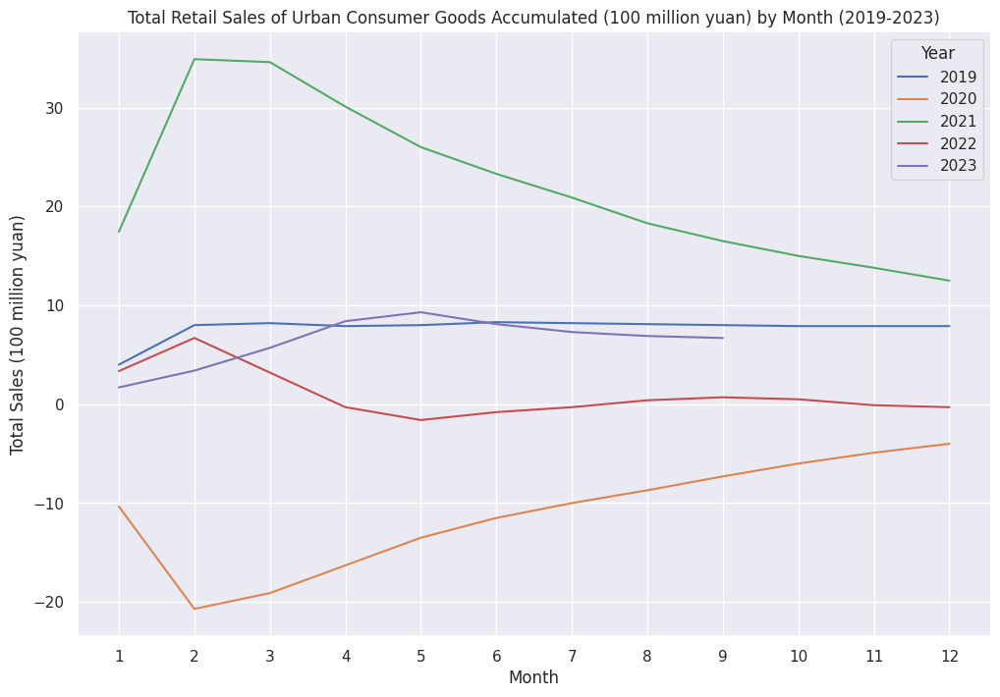

In [15]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

file_path = 'cleaned.xlsx'  # Replace with your file path
data = pd.read_excel(file_path)


data_cleaned = data[['Unnamed: 0', 'Total Retail Sales of Urban Consumer Goods']].copy()


data_cleaned.columns = ['Time', 'TotalSales']


data_cleaned = data_cleaned.drop([0, 1])


data_cleaned['Time'] = pd.to_datetime(data_cleaned['Time'])
data_cleaned['TotalSales'] = pd.to_numeric(data_cleaned['TotalSales'], errors='coerce')


data_cleaned = data_cleaned[data_cleaned['Time'].dt.year.between(2019, 2023)]


data_cleaned['Year'] = data_cleaned['Time'].dt.year
data_cleaned['Month'] = data_cleaned['Time'].dt.month


grouped_data = data_cleaned.groupby(['Year', 'Month']).mean()


plt.figure(figsize=(12, 8))


years = grouped_data.index.get_level_values(0).unique()


for year in years:
    plt.plot(grouped_data.loc[year].index, grouped_data.loc[year]['TotalSales'], label=str(year))

plt.title('Total Retail Sales of Urban Consumer Goods Accumulated (100 million yuan) by Month (2019-2023)')
plt.xlabel('Month')
plt.ylabel('Total Sales (100 million yuan)')
plt.legend(title='Year')
plt.grid(True)
plt.xticks(np.arange(1, 13, 1))  # Setting x-ticks to be each month

plt.show()


<ipython-input-16-ad50d53895f4>:29: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_data = data_cleaned.groupby(['Year', 'Month']).mean()


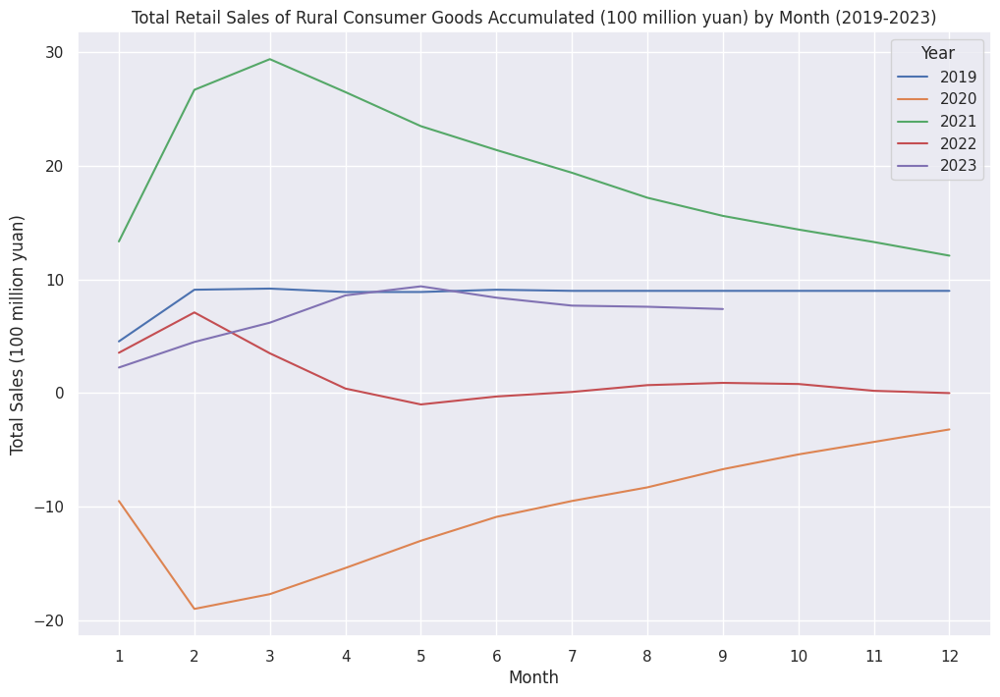

In [16]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

file_path = 'cleaned.xlsx'  # Replace with your file path
data = pd.read_excel(file_path)


data_cleaned = data[['Unnamed: 0', 'Total Retail Sales of Rural Consumer Goods']].copy()


data_cleaned.columns = ['Time', 'TotalSales']


data_cleaned = data_cleaned.drop([0, 1])


data_cleaned['Time'] = pd.to_datetime(data_cleaned['Time'])
data_cleaned['TotalSales'] = pd.to_numeric(data_cleaned['TotalSales'], errors='coerce')


data_cleaned = data_cleaned[data_cleaned['Time'].dt.year.between(2019, 2023)]


data_cleaned['Year'] = data_cleaned['Time'].dt.year
data_cleaned['Month'] = data_cleaned['Time'].dt.month


grouped_data = data_cleaned.groupby(['Year', 'Month']).mean()


plt.figure(figsize=(12, 8))


years = grouped_data.index.get_level_values(0).unique()


for year in years:
    plt.plot(grouped_data.loc[year].index, grouped_data.loc[year]['TotalSales'], label=str(year))

plt.title('Total Retail Sales of Rural Consumer Goods Accumulated (100 million yuan) by Month (2019-2023)')
plt.xlabel('Month')
plt.ylabel('Total Sales (100 million yuan)')
plt.legend(title='Year')
plt.grid(True)
plt.xticks(np.arange(1, 13, 1))  # Setting x-ticks to be each month

plt.show()


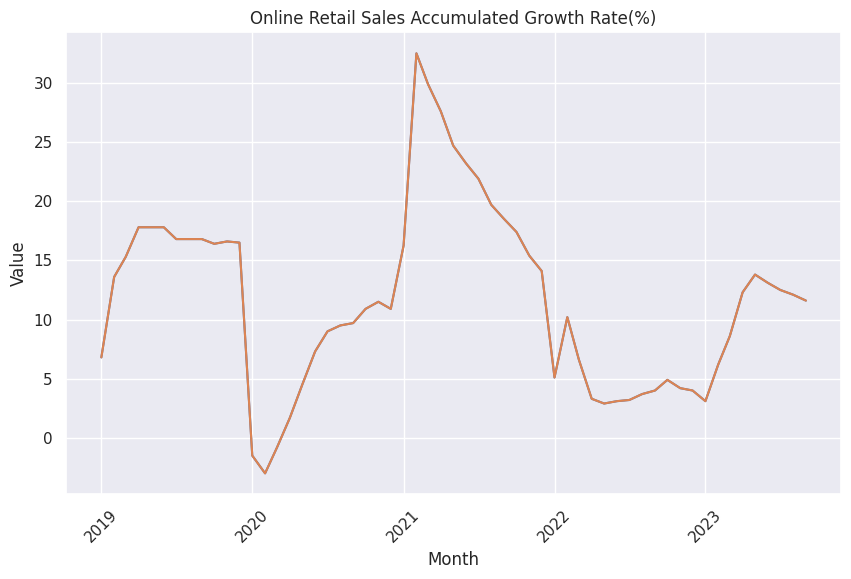

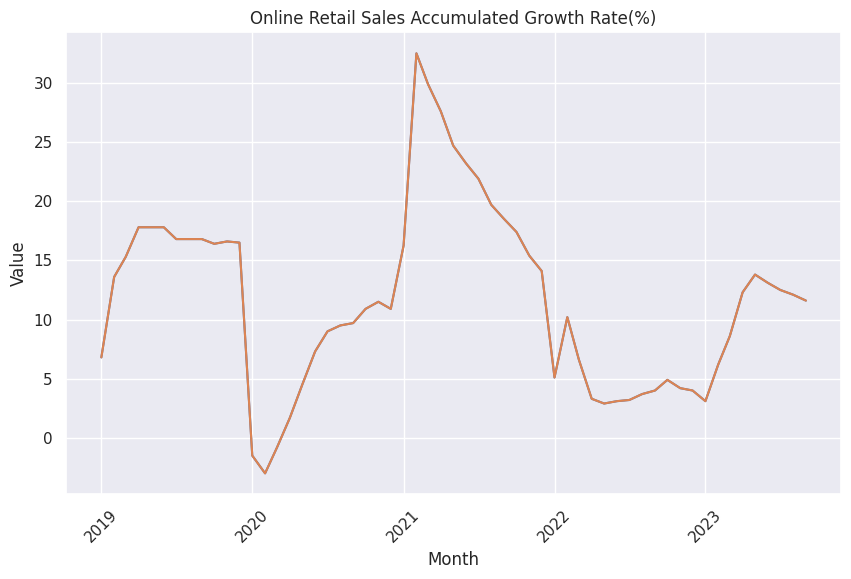

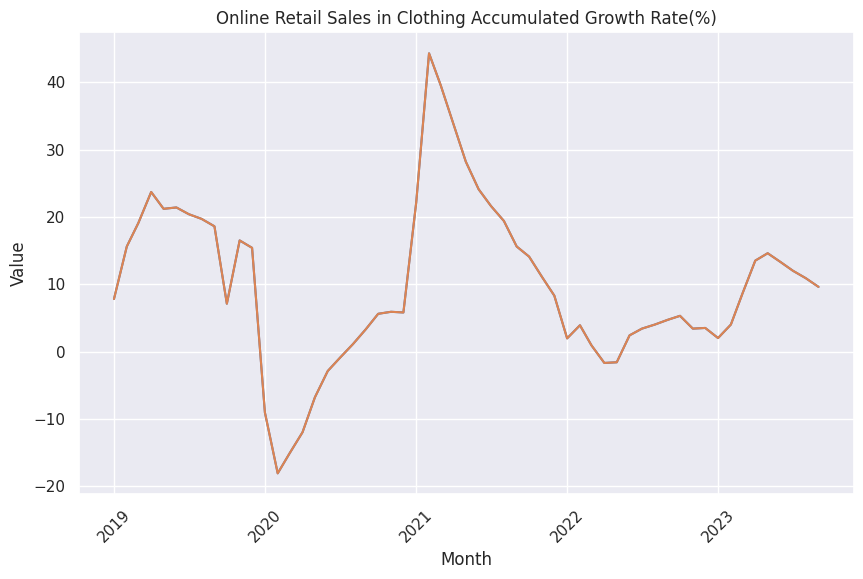

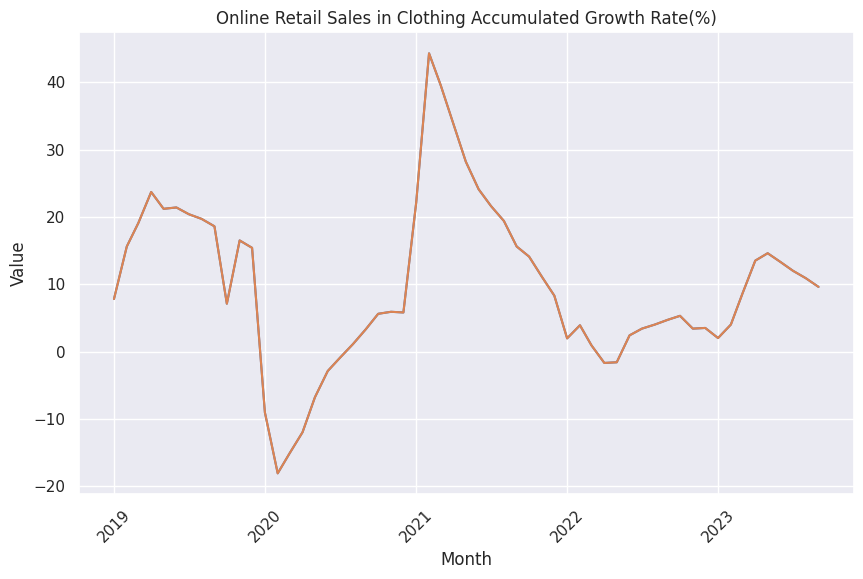

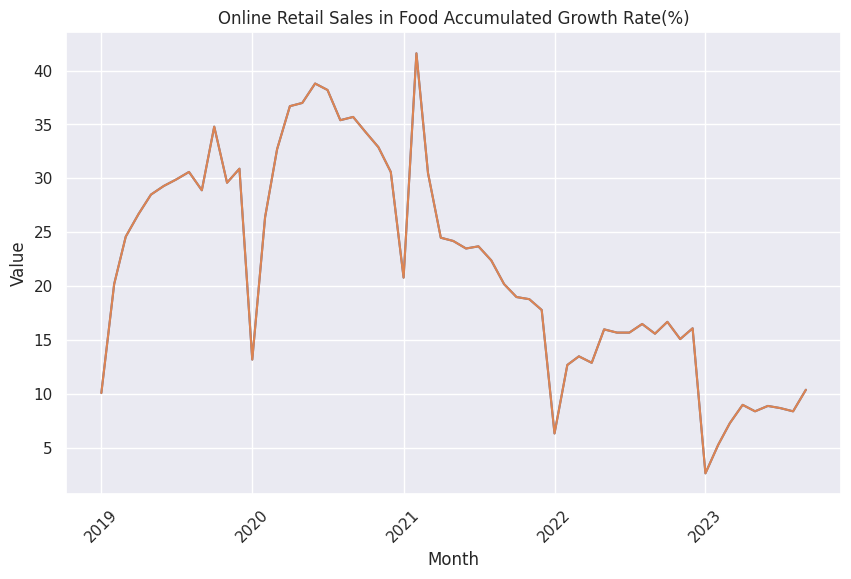

...

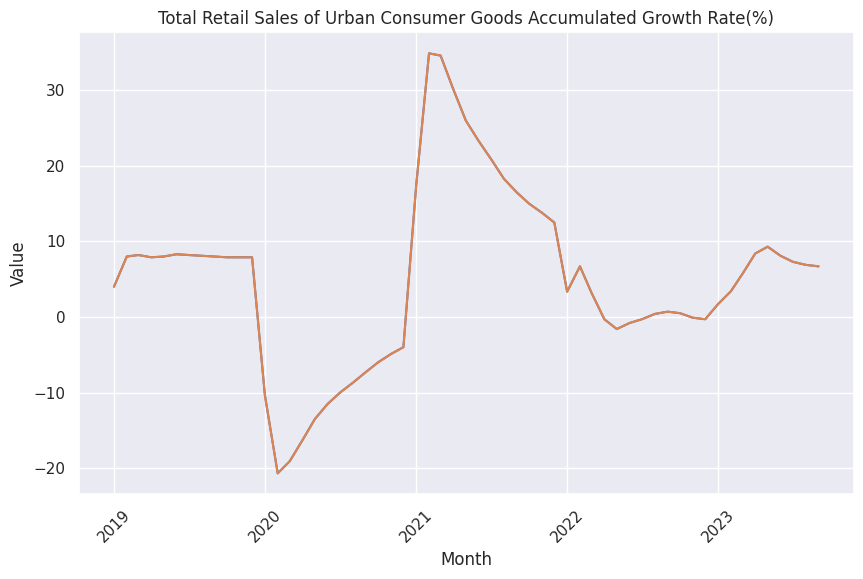

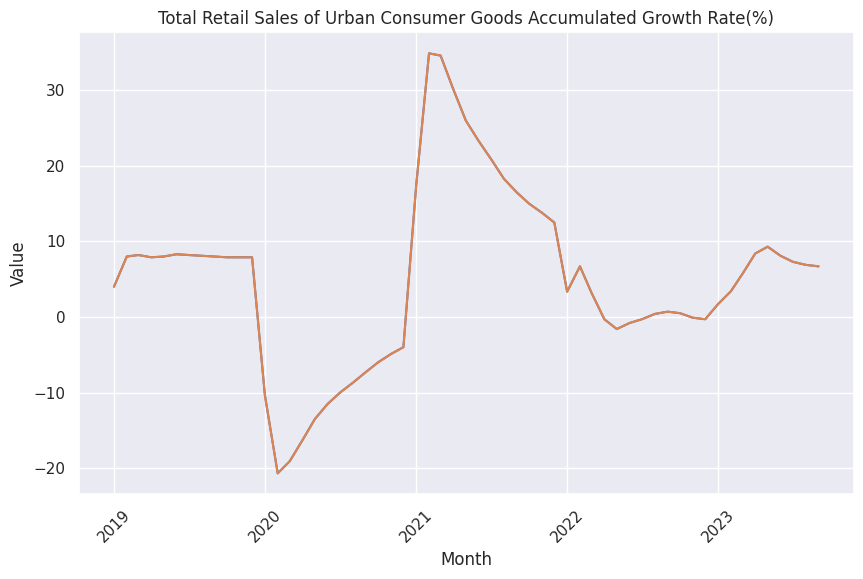

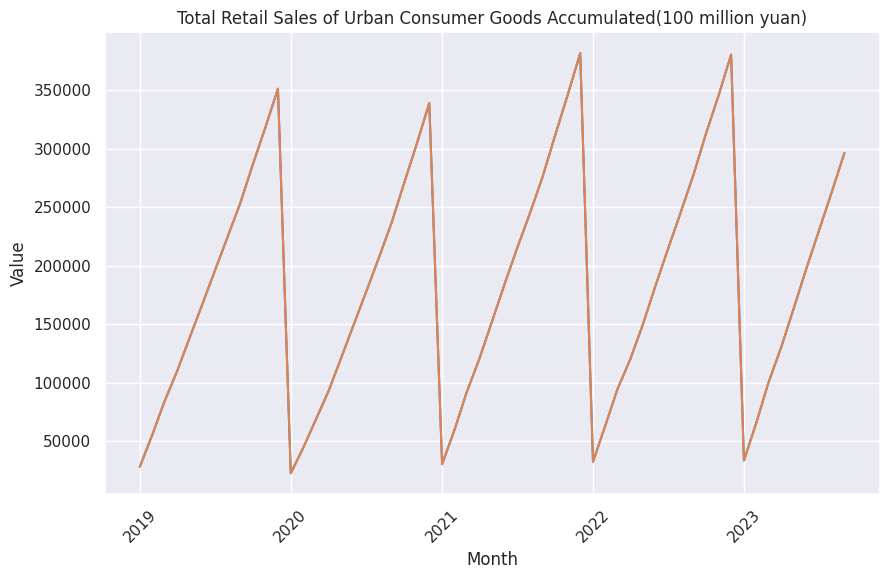

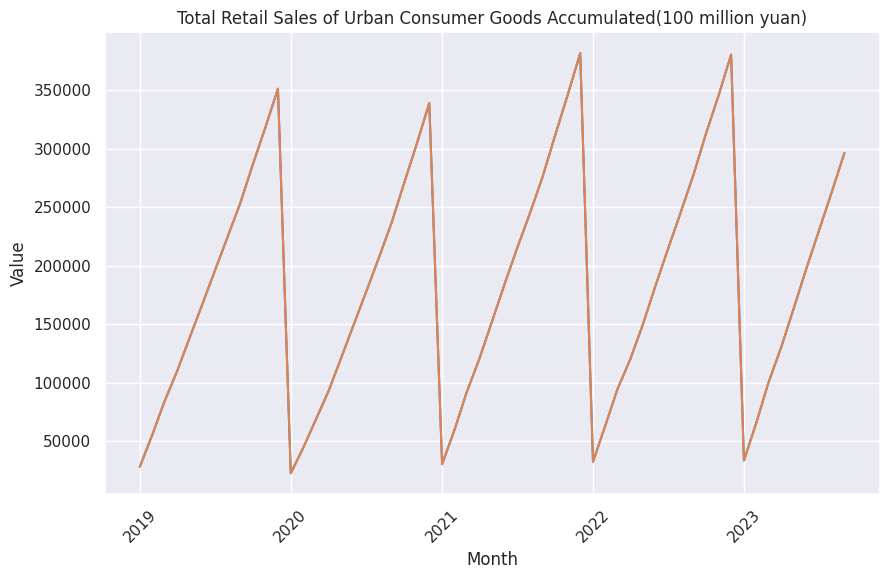

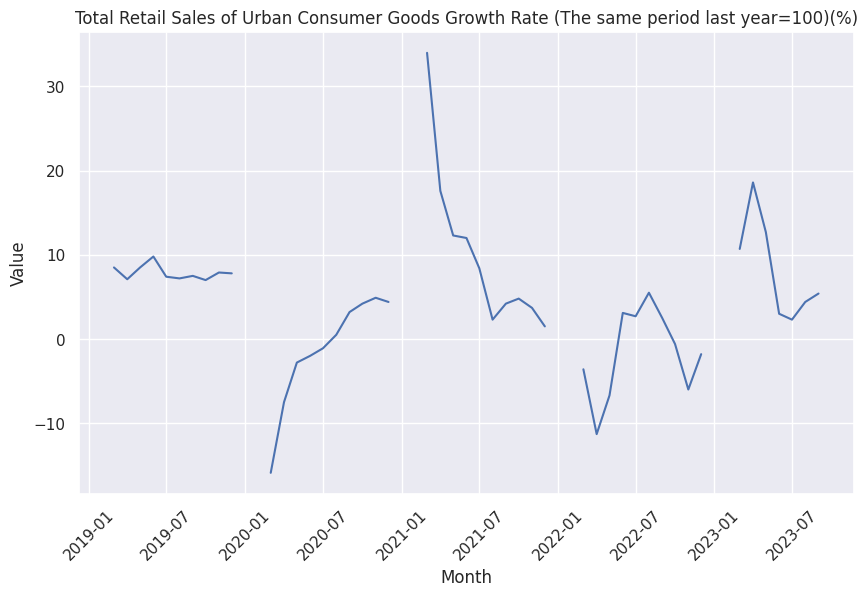

In [ ]:
for col in df.columns:
    plt.figure(figsize=(10, 6))
    plt.plot(df.index, df[col])
    plt.xlabel('Month')
    plt.ylabel('Value')
    plt.xticks(rotation=45)
    plt.title(col[0] + col[1])
    plt.show()

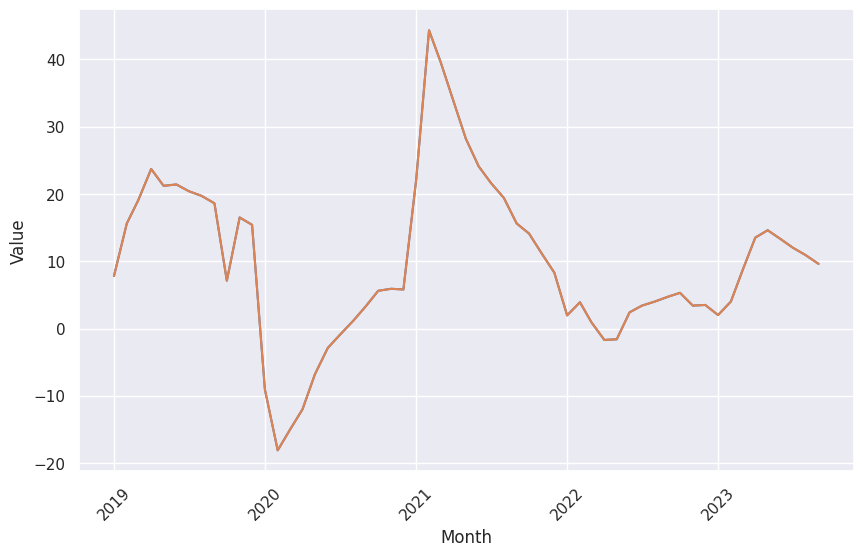

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(df.index, df[("Online Retail Sales in Clothing", " Accumulated Growth Rate(%)")])
plt.xlabel('Month')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.show()

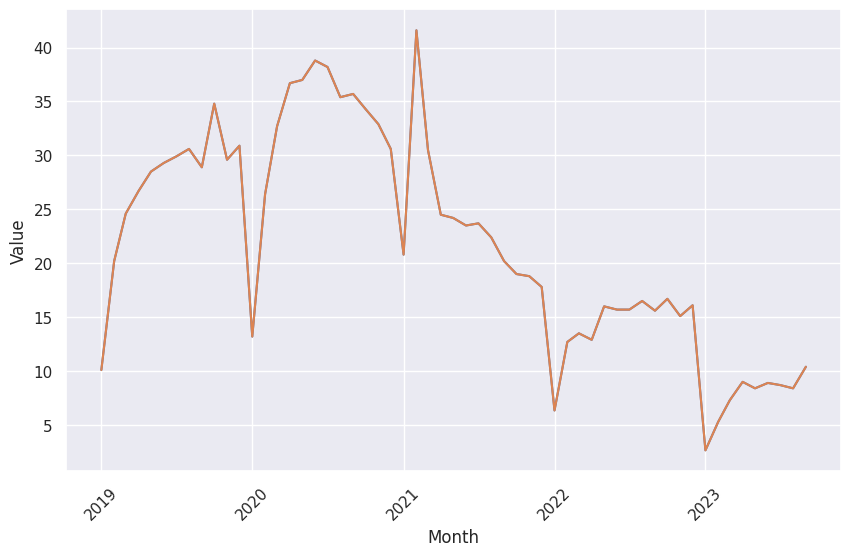

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(df.index, df[("Online Retail Sales in Food", " Accumulated Growth Rate(%)")])
plt.xlabel('Month')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.show()

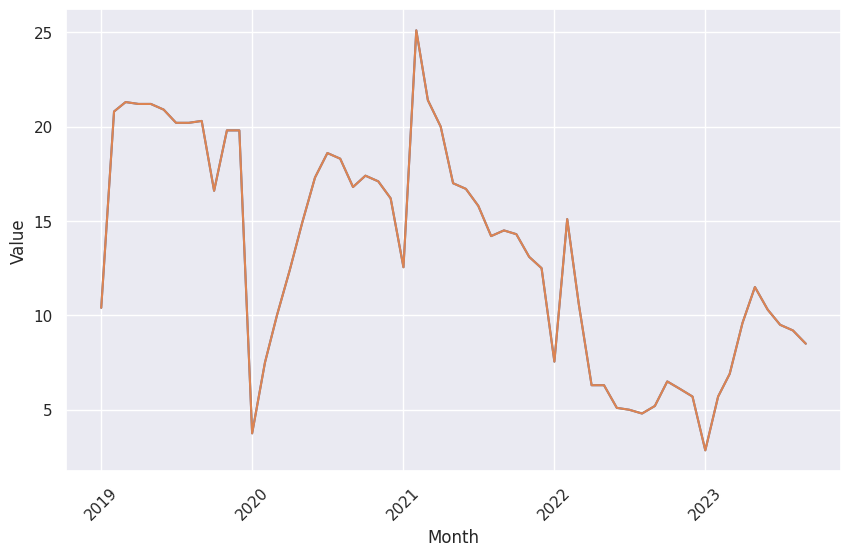

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(df.index, df[("Online Retail Sales in Necessities", " Accumulated Growth Rate(%)")])
plt.xlabel('Month')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.show()

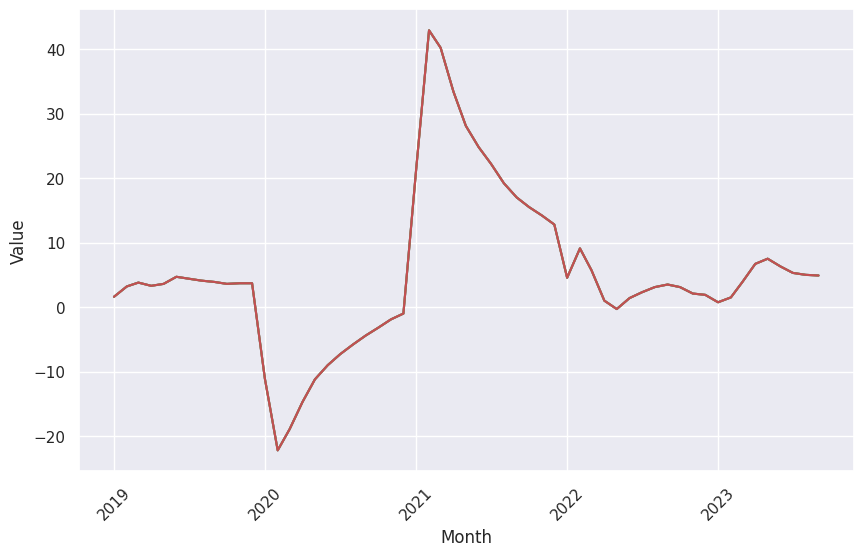

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(df.index, df[("Retail Sales of Enterprises above Designated Size", " Accumulated Growth Rate(%)")])
plt.xlabel('Month')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.show()